# End to End Object Detection with Transformers in ART

Demo for applying the DEtection TRansformer (DETR) estimator in ART for object detection and attacking the Detection Transformer using the Robust DPatch method.

### Define imports, constants and helper functions

In [1]:
import sys 
!{sys.executable} -m pip install --user adversarial-robustness-toolbox
!{sys.executable} -m pip install --user torch
!{sys.executable} -m pip install --user pillow



from art.estimators.object_detection.pytorch_detection_transformer import PyTorchDetectionTransformer
from art.attacks.evasion.adversarial_patch.adversarial_patch_pytorch import AdversarialPatchPyTorch
from torchvision.transforms import transforms
import PIL.Image
import numpy as np
import torch
import cv2
import matplotlib.pyplot as plt
import requests
import pandas as pd

COCO_CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
    'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

def extract_predictions(predictions_, conf_thresh):
    predictions_class = [COCO_CLASSES[i] for i in list(predictions_["labels"])]
    if len(predictions_class) < 1:
        return [], [], []
        
    predictions_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(predictions_["boxes"])]
    predictions_score = list(predictions_["scores"])

    threshold = conf_thresh
    predictions_t = [predictions_score.index(x) for x in predictions_score if x > threshold]
    if len(predictions_t) > 0:
        predictions_t = predictions_t
    else:
        return [], [], []
        
    predictions_boxes = [predictions_boxes[i] for i in predictions_t]
    predictions_class = [predictions_class[i] for i in predictions_t]
    predictions_scores = [predictions_score[i] for i in predictions_t]
    return predictions_class, predictions_boxes, predictions_scores

def plot_image_with_boxes(img, boxes, pred_cls, title):
    text_size = 2
    text_th = 2
    rect_th = 2

    for i in range(len(boxes)):
        cv2.rectangle(img, (int(boxes[i][0][0]), int(boxes[i][0][1])), (int(boxes[i][1][0]), int(boxes[i][1][1])),
                      color=(0, 255, 0), thickness=rect_th)
        cv2.putText(img, pred_cls[i], (int(boxes[i][0][0]), int(boxes[i][0][1])), cv2.FONT_HERSHEY_SIMPLEX, text_size,
                    (0, 255, 0), thickness=text_th)
    plt.figure()
    plt.axis("off")
    plt.title(title)
    plt.imshow(img)

def filter_boxes(predictions, conf_thresh):
    dictionary = {}

    boxes_list = []
    scores_list = []
    labels_list = []

    for i in range(len(predictions[0]["boxes"])):
        score = predictions[0]["scores"][i]
        if score >= conf_thresh:
            boxes_list.append(predictions[0]["boxes"][i])
            scores_list.append(predictions[0]["scores"][[i]])
            labels_list.append(predictions[0]["labels"][[i]])

    dictionary["boxes"] = np.vstack(boxes_list)
    dictionary["scores"] = np.hstack(scores_list)
    dictionary["labels"] = np.hstack(labels_list)

    y = [dictionary]

    return y

MEAN = [0.485, 0.456, 0.406]
STD = [0.229, 0.224, 0.225]
NUMBER_CHANNELS = 3
INPUT_SHAPE = (NUMBER_CHANNELS, 800, 800)

transform = transforms.Compose([
        transforms.Resize([INPUT_SHAPE[1], INPUT_SHAPE[2]], interpolation=transforms.InterpolationMode.BICUBIC),
        transforms.ToTensor()
    ])



[notice] A new release of pip available: 22.2.1 -> 23.3.1
[notice] To update, run: pip3.10 install --upgrade pip

[notice] A new release of pip available: 22.2.1 -> 23.3.1
[notice] To update, run: pip3.10 install --upgrade pip

[notice] A new release of pip available: 22.2.1 -> 23.3.1
[notice] To update, run: pip3.10 install --upgrade pip


In [ ]:
PATCH_MAX_ITER = 100
WHITEBOX_MAX_ITER = 100

### Load COCO images and resize

In [2]:
urls_original = ['http://images.cocodataset.org/val2017/000000039769.jpg',
'http://images.cocodataset.org/val2017/000000397133.jpg',
'http://images.cocodataset.org/val2017/000000037777.jpg',
'http://images.cocodataset.org/val2017/000000454661.jpg',
'http://images.cocodataset.org/val2017/000000094852.jpg']

urls_doesnt_work =  ['http://images.cocodataset.org/unlabeled2017/000000484630.jpg',
'http://images.cocodataset.org/unlabeled2017/000000114599.jpg',
'http://images.cocodataset.org/unlabeled2017/000000037777.jpg',
'http://images.cocodataset.org/unlabeled2017/000000089937.jpg',
'http://images.cocodataset.org/unlabeled2017/000000094756.jpg']

target_image_url = 'http://images.cocodataset.org/val2017/000000350002.jpg'

urls = ['http://images.cocodataset.org/val2017/000000084170.jpg',
        'http://images.cocodataset.org/val2017/000000088462.jpg',
        'http://images.cocodataset.org/val2017/000000124798.jpg',
        'http://images.cocodataset.org/val2017/000000138979.jpg',
        'http://images.cocodataset.org/val2017/000000142585.jpg',
        'http://images.cocodataset.org/val2017/000000155341.jpg',
        'http://images.cocodataset.org/val2017/000000192607.jpg',
        'http://images.cocodataset.org/val2017/000000269942.jpg',
        'http://images.cocodataset.org/val2017/000000376625.jpg',
        'http://images.cocodataset.org/val2017/000000385190.jpg',
        'http://images.cocodataset.org/val2017/000000350002.jpg'] #last image is target image



coco_images = []
for url in urls:
    im = PIL.Image.open(requests.get(url, stream=True).raw)
    im = transform(im).numpy()
    coco_images.append(im)
coco_images = np.array(coco_images)

### Create the detector

In [3]:
detector = PyTorchDetectionTransformer(channels_first=True, preprocessing=(MEAN, STD), input_shape=INPUT_SHAPE, clip_values=(0,1))

Using cache found in /users/antilaan/.cache/torch/hub/facebookresearch_detr_main
/scratch/project_2008539/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/scratch/project_2008539/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


### Test detector on COCO images

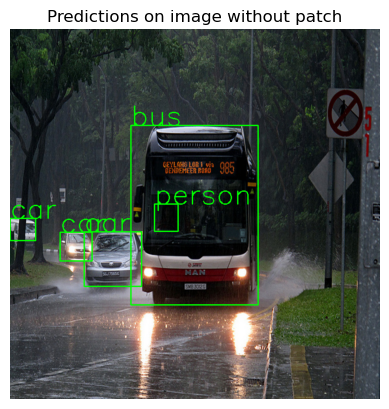

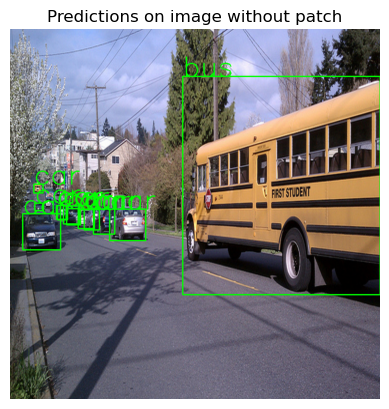

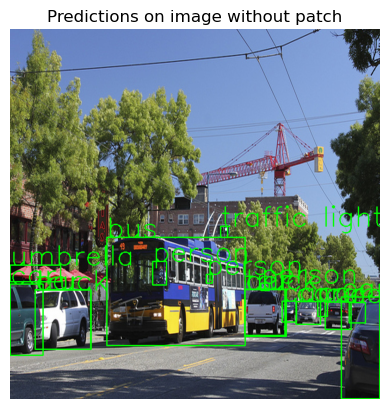

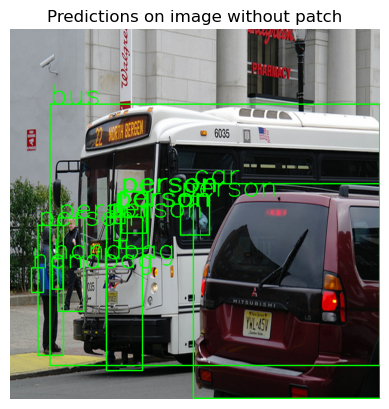

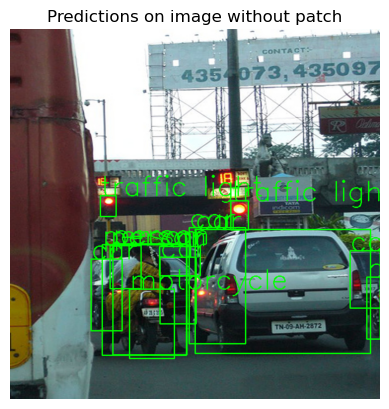

...

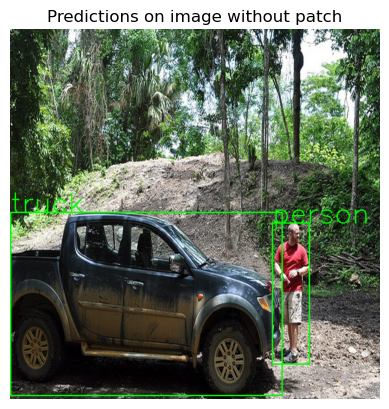

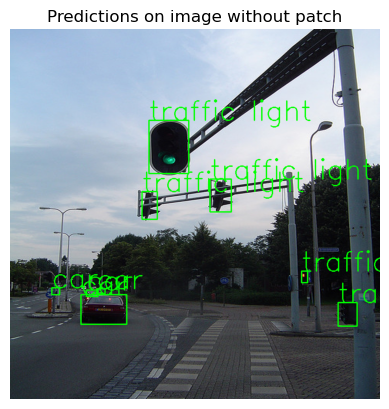

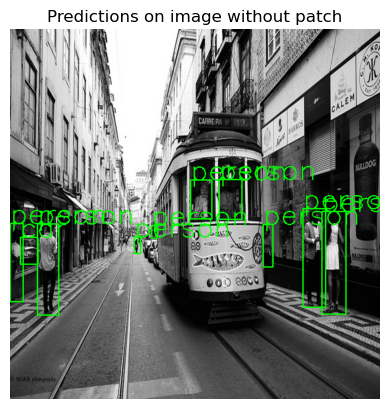

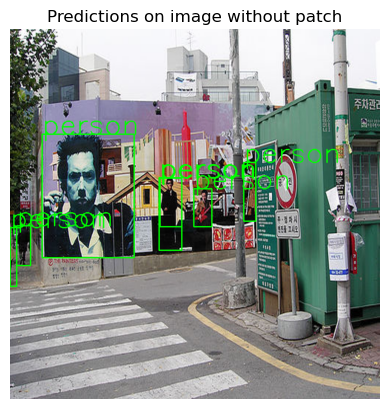

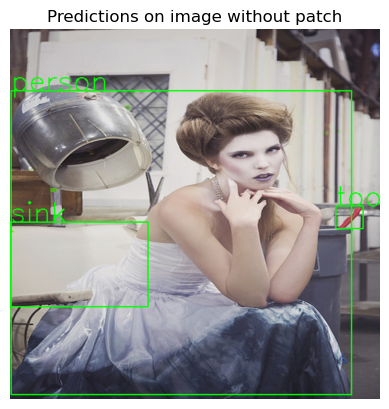

In [4]:
results = detector.predict(coco_images)
for i in range(len(results)):
    preds = extract_predictions(results[i], 0.8)
    im = (torch.from_numpy(coco_images)[i].numpy().transpose(1,2,0)*255).astype(np.uint8)
    plot_image_with_boxes(img=im.copy(), boxes=preds[1], pred_cls=preds[0], title="Predictions on image without patch")

### PGD Attack
Targeted PGD attack using the last image above of elephants to create adversarial examples that force DETR to see elephants in other images.

<class 'numpy.ndarray'>
11


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


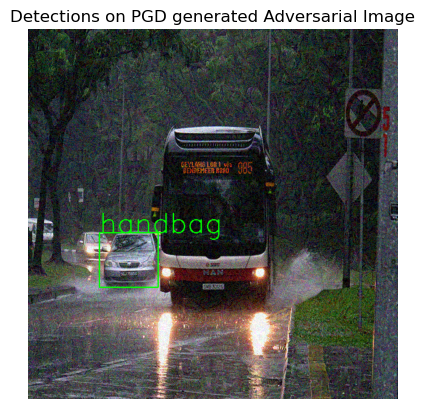

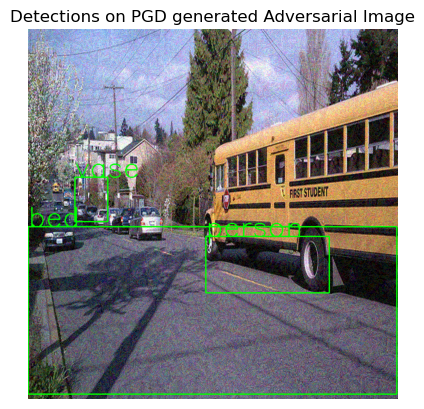

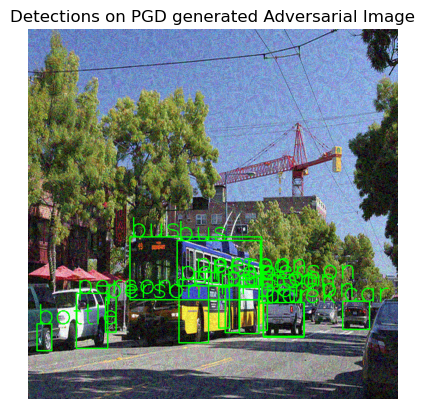

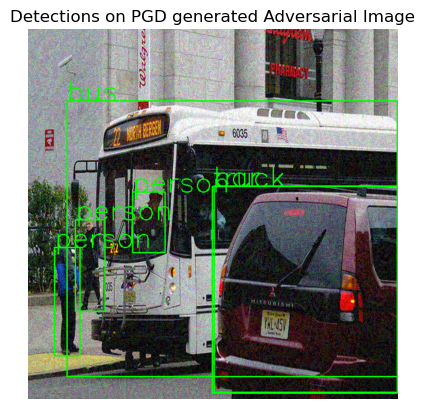

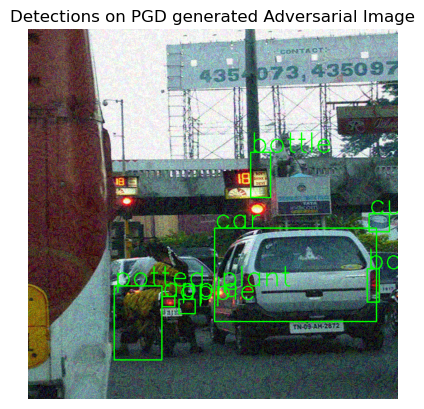

...

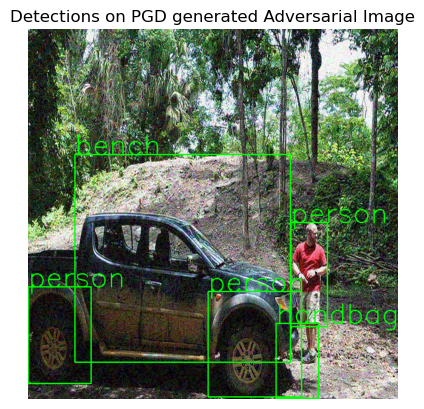

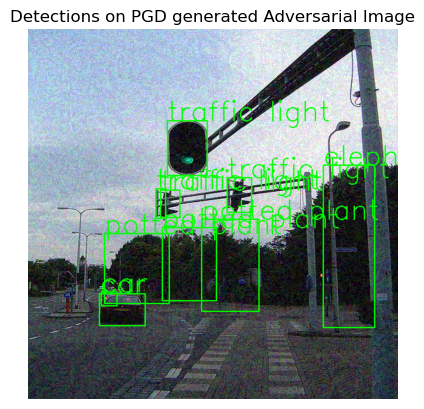

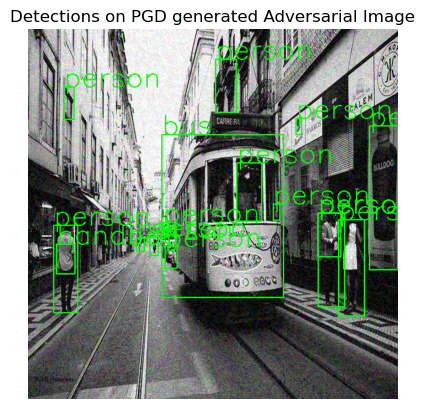

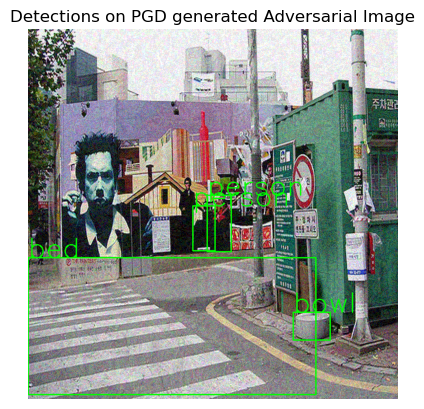

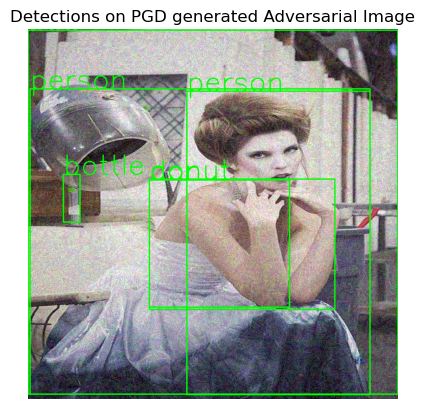

In [5]:
from art.attacks.evasion import ProjectedGradientDescent

attack = ProjectedGradientDescent(detector, targeted=True, max_iter=WHITEBOX_MAX_ITER, eps=0.1) #change iter

dets = detector.predict(coco_images)
filtered_dets = [filter_boxes([t], 0.8)[0] for t in dets]

# Tähän for looppi jossa lasketaan KAIKILLE KYMMENELLE PGD 
x = coco_images[[0]]
target = filtered_dets[-1:] #orignal: -1:
count=0
print("Starting PGD attack")
for image in coco_images:
    x = coco_images[[count]]
    adv = attack.generate(x, y=target)

    adv_dets = detector.predict(adv)
    preds = extract_predictions(adv_dets[0], 0.8)
    im = adv[0].transpose(1,2,0)
    plot_image_with_boxes(img=im.copy(), boxes=preds[1], pred_cls=preds[0], title=f"Detections on PGD generated Adversarial Image")
    count +=1

print("PGD attack done")

In [6]:
#untargeted PGD

<class 'numpy.ndarray'>
11


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PGD - Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


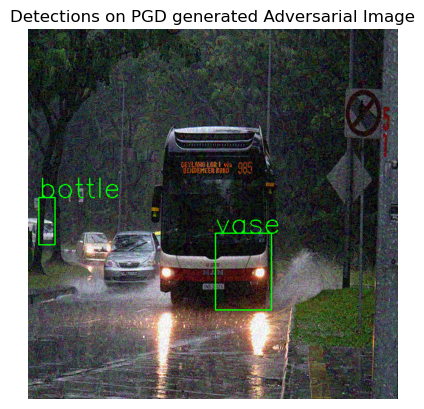

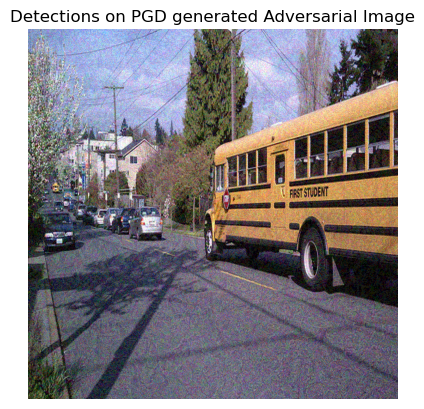

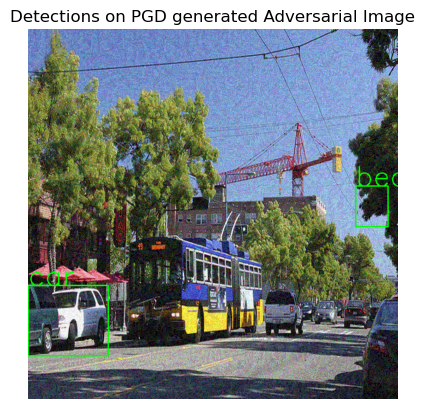

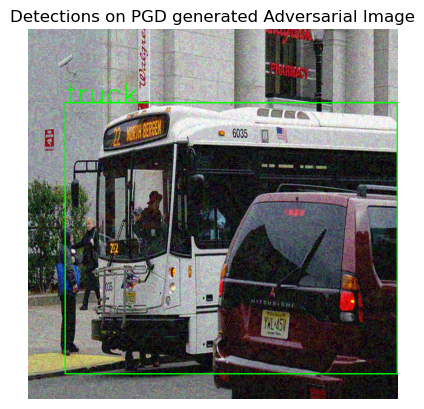

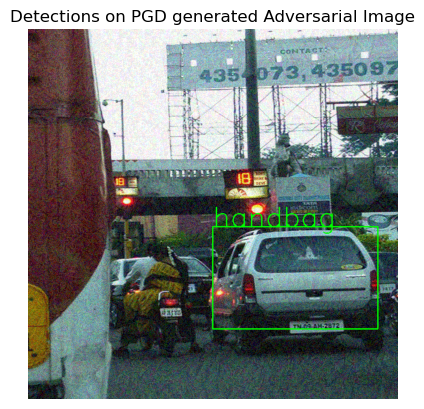

...

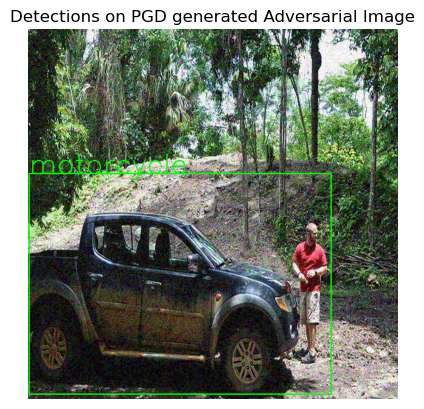

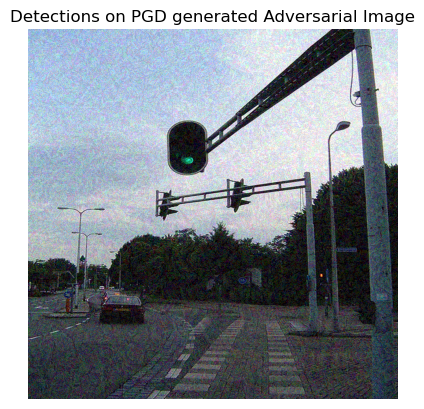

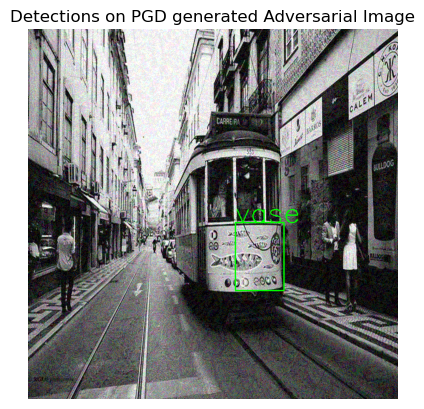

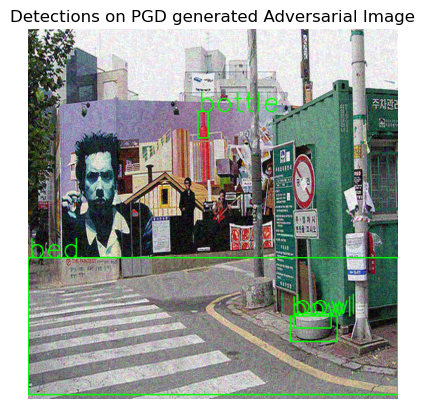

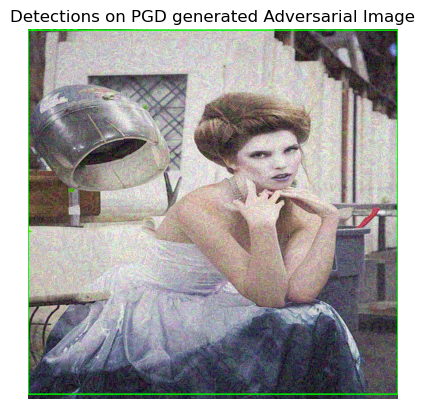

In [7]:
from art.attacks.evasion import ProjectedGradientDescent
print("Startring untargeted PGD")

attack = ProjectedGradientDescent(detector, targeted=False, max_iter=WHITEBOX_MAX_ITER, eps=0.1) #change iter

dets = detector.predict(coco_images)
filtered_dets = [filter_boxes([t], 0.8)[0] for t in dets]

# Tähän for looppi jossa lasketaan KAIKILLE KYMMENELLE PGD 
x = coco_images[[0]]
target = filtered_dets[-1:] #orignal: -1:
count=0
for image in coco_images:
    x = coco_images[[count]]
    adv = attack.generate(x)

    adv_dets = detector.predict(adv)
    preds = extract_predictions(adv_dets[0], 0.8)
    im = adv[0].transpose(1,2,0)
    plot_image_with_boxes(img=im.copy(), boxes=preds[1], pred_cls=preds[0], title=f"Detections on PGD generated Adversarial Image")
    count +=1
print("Untargeted PGD done")


# FGSM attack

<class 'numpy.ndarray'>
11


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

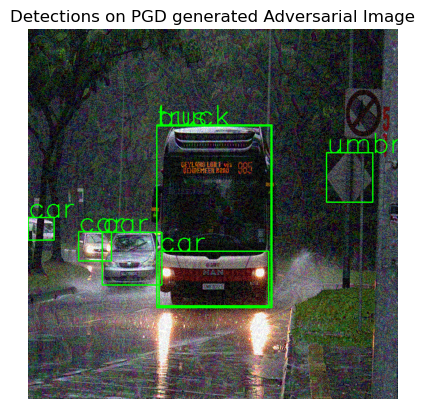

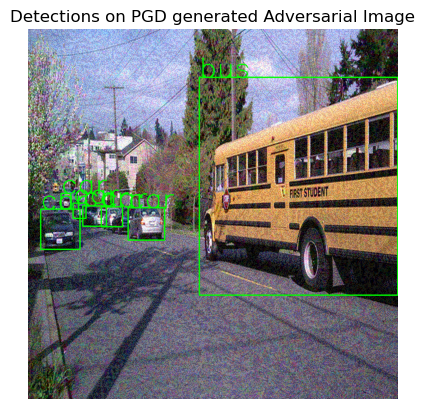

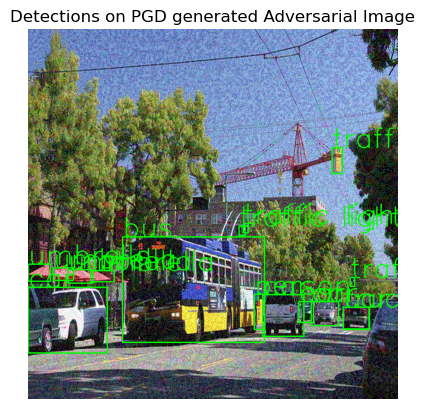

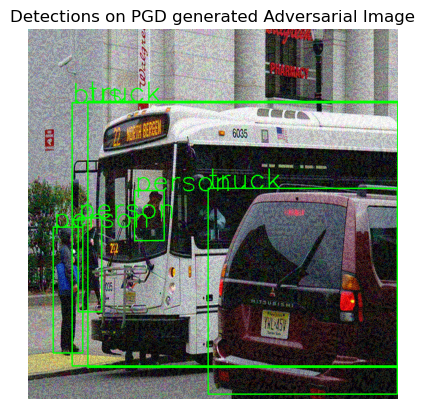

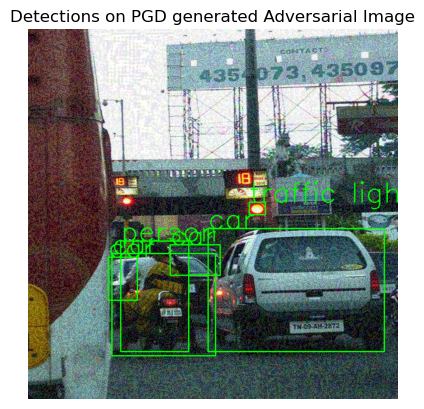

...

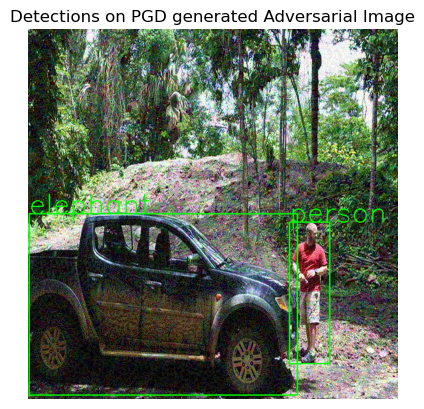

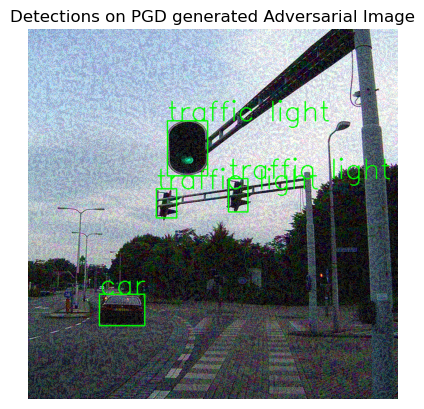

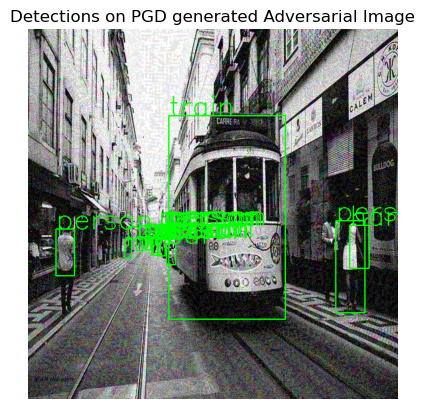

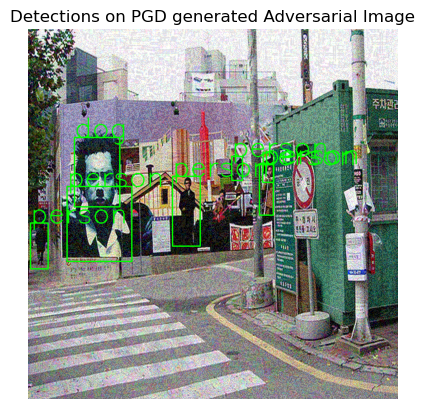

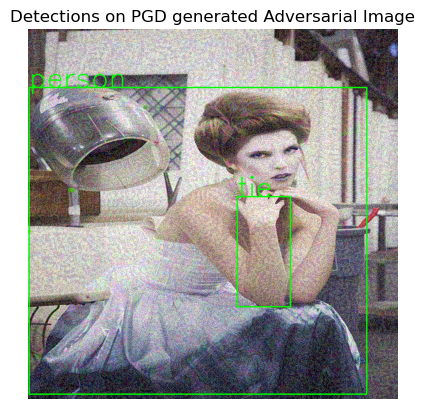

In [8]:
from art.attacks.evasion import FastGradientMethod
print("Starting FGSM")

attack = FastGradientMethod(detector, eps=0.1)

dets = detector.predict(coco_images)
filtered_dets = [filter_boxes([t], 0.8)[0] for t in dets]

# Tähän for looppi jossa lasketaan KAIKILLE KYMMENELLE FGSM 
x = coco_images[[0]]
target = filtered_dets[-1:] #orignal: -1:
count=0
for image in coco_images:
    x = coco_images[[count]]
    adv = attack.generate(x, y=target)

    adv_dets = detector.predict(adv)
    preds = extract_predictions(adv_dets[0], 0.8)
    im = adv[0].transpose(1,2,0)
    plot_image_with_boxes(img=im.copy(), boxes=preds[1], pred_cls=preds[0], title=f"Detections on FGSM generated Adversarial Image")
    count +=1
print("FGSM done")


In [9]:
#baddet

### Adversarial Patch Attack
1. Targeted patch attack using elephant image from COCO as target to generate patch that forces DETR to detect elephants in images when patch applied.
2. Untargeted patch attack causing DETR to detect random objects not relevant to the image
3. Untargeted patch attack plot of loss components over epochs

##### Targeted attack

In [ ]:
print("Starting patch")
dets = detector.predict(coco_images)
filtered_dets = [filter_boxes([t], 0.8)[0] for t in dets]

x = coco_images[:-1]
targets = [filtered_dets[-1] for i in range(len(x))]

rotation_max=0.0
scale_min=0.5
scale_max=2
distortion_scale_max=0.0
learning_rate=1.99 
max_iter=PATCH_MAX_ITER #muokattu
batch_size=16
patch_shape=(3, 300, 300)
patch_location=(100,100)
patch_type="square"
optimizer="adam"

ap = AdversarialPatchPyTorch(estimator=detector, rotation_max=rotation_max, 
                      scale_min=scale_min, scale_max=scale_max, distortion_scale_max=distortion_scale_max,
                      learning_rate=learning_rate, max_iter=max_iter, batch_size=batch_size, patch_location=patch_location,
                      patch_shape=patch_shape, patch_type=patch_type, verbose=True, targeted=True)

patch, patch_mask = ap.generate(x=x[[0]], y=targets[:1])

plt.axis("off")
plt.imshow(((patch) * patch_mask).transpose(1,2,0))
plt.show()

Adversarial Patch PyTorch:   0%|          | 0/500 [00:00<?, ?it/s]

/scratch/project_2008539/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [ ]:
# Do it for all 10 images
count =0
for image in coco_images:
    
    patched_images = ap.apply_patch(coco_images[[count]], scale=0.1)
    dets = detector.predict(patched_images)
    count +=1

for i in range(len(dets)):
    preds_orig = extract_predictions(dets[i], 0.8)
    plot_image_with_boxes(img=patched_images[i].transpose(1,2,0).copy(), boxes=preds_orig[1], pred_cls=preds_orig[0],
                           title="Predictions on image with patch")
print("Patch done")

##### Untargeted attack

In [ ]:
dets = detector.predict(coco_images)
print("Starting untargeted path")
filtered_dets = [filter_boxes([t], 0.8)[0] for t in dets]

x = coco_images[:-1]
targets = [filtered_dets[-1] for i in range(len(x))]

rotation_max=0.0
scale_min=0.5
scale_max=1
distortion_scale_max=0.0
learning_rate=1.99
max_iter=PATCH_MAX_ITER
batch_size=16
patch_shape=(3, 300, 300)
patch_location=(100,100)
patch_type="square"
optimizer="adam"

ap = AdversarialPatchPyTorch(estimator=detector, rotation_max=rotation_max, 
                      scale_min=scale_min, scale_max=scale_max, distortion_scale_max=distortion_scale_max,
                      learning_rate=learning_rate, max_iter=max_iter, batch_size=batch_size, patch_location=patch_location,
                      patch_shape=patch_shape, patch_type=patch_type, verbose=True, targeted=False)

patch, patch_mask = ap.generate(x=x[[0]], y=filtered_dets[:1])

plt.axis("off")
plt.imshow(((patch) * patch_mask).transpose(1,2,0))
plt.show()

In [ ]:
# Apply patch to 10 images
count =0
for image in coco_images:
    
    patched_images = ap.apply_patch(coco_images[[count]], scale=0.3)
    dets = detector.predict(patched_images)
    count +=1
for i in range(len(dets)):
    preds_orig = extract_predictions(dets[i], 0.8)
    plot_image_with_boxes(img=patched_images[i].transpose(1,2,0).copy(), boxes=preds_orig[1], pred_cls=preds_orig[0],
                           title="Predictions on image with patch")
    print(f'Patched prediction classes for image {i+1}:', preds_orig[0])
print("untargeted patch done")

##### Untargeted attack plotting the loss components over epochs

In [ ]:
from tqdm import tqdm

dets = detector.predict(coco_images)
y = [filter_boxes([t], 0.8)[0] for t in dets]

x = coco_images[:-1]
target = [y[-1] for i in range(len(coco_images[:-1]))]

rotation_max=0.0
scale_min=0.2
scale_max=0.4
distortion_scale_max=0.0
learning_rate=1.99
max_iter=PATCH_MAX_ITER
batch_size=16
patch_shape=(3, 80, 80)
patch_location=(10,10)
patch_type="square"
optimizer="adam"

attack = AdversarialPatchPyTorch(estimator=detector, rotation_max=rotation_max, 
                      scale_min=scale_min, scale_max=scale_max, distortion_scale_max=distortion_scale_max,
                      learning_rate=learning_rate, max_iter=max_iter, batch_size=batch_size, patch_location=patch_location,
                      patch_shape=patch_shape, patch_type=patch_type, verbose=False, targeted=False)

loss_history = []
for i in tqdm(range(50)):
    patch = attack.generate(x[[0]], y[:1])
    patched_images = attack.apply_patch(x[[3]], scale=0.4)

    loss_components = detector.compute_losses(patched_images, y[:1])
    losses = {}
    for loss in loss_components.keys():
        if 'loss' in loss:
            losses[loss] = loss_components[loss].item()
    loss_history.append(losses)

    if i%20==0:
        _y = detector.predict(patched_images)
        preds = extract_predictions(_y[0], 0.5)
        im = (patched_images[0].transpose(1,2,0))
        plot_image_with_boxes(img=im.copy(), boxes=preds[1], pred_cls=preds[0], title=f"Detection [with patch, iter: {i}]")

_y = detector.predict(patched_images)
preds = extract_predictions(_y[0], 0.5)
im = (patched_images[0].transpose(1,2,0))
plot_image_with_boxes(img=im.copy(), boxes=preds[1], pred_cls=preds[0], title=f"Detection [with patch,iter: {i}]")

In [ ]:
losses = pd.DataFrame(loss_history)
fig, axes = plt.subplots(nrows=1,ncols=3,figsize=(12,3))
losses.loss_ce.plot(ylabel='loss', ax = axes[0], subplots=True, color='g')
losses.loss_bbox.plot(xlabel='epoch', ax = axes[1],subplots=True, color='royalblue')
losses.loss_giou.plot( ax = axes[2],subplots=True, color='orange')


axes[0].set_title('Classification Loss')
axes[1].set_title('BBox L1 Regression Loss')
axes[2].set_title('BBox GIoU Loss')
fig.tight_layout()